# [California housing dataset](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_california_housing.html) - predict the price of a house


This was an "Explore more"-task in the ML Zoomcamp in Module 2. The task was to use the California housing dataset and build a regression model to predict the price of a house.


## Importing Libraries


In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns

from shapely.geometry import Point

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split

# from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

## Getting the Data


A description of the dataset can be found in the [User guide](https://scikit-learn.org/stable/datasets/real_world.html#california-housing-dataset).


In [2]:
housing = fetch_california_housing()
print(housing.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

:Number of Instances: 20640

:Number of Attributes: 8 numeric, predictive attributes and the target

:Attribute Information:
    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group longitude

:Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per ce

## EDA


In [3]:
print(housing.data.shape, housing.target.shape)

(20640, 8) (20640,)


In [4]:
print(housing.feature_names)

['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']


### Histograms and Boxplots


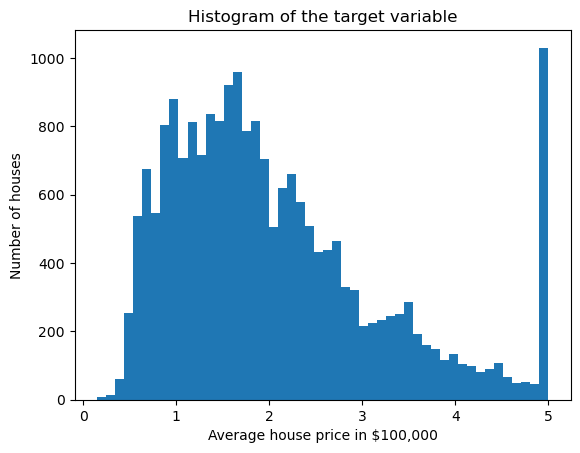

In [5]:
# Plot the histogram of the target variable
plt.hist(housing.target, bins=50)
plt.xlabel("Average house price in $100,000")
plt.ylabel("Number of houses")
plt.title("Histogram of the target variable")
plt.show();

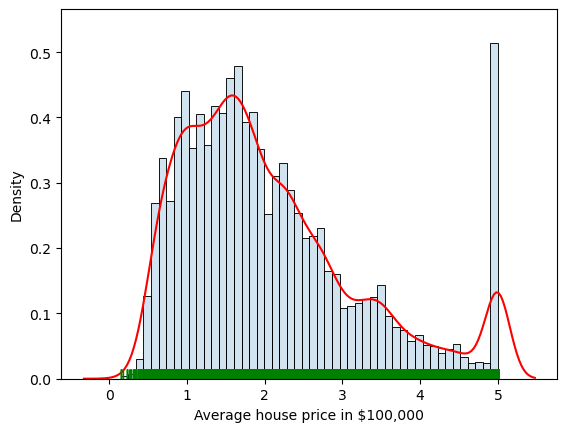

In [6]:
# Plot the histogram of the target variable with seaborn (histplot, kdeplot, rugplot)
fig, ax = plt.subplots()

sns.histplot(housing.target, bins=50, stat="density", ax=ax, alpha=0.2)
sns.kdeplot(housing.target, color="r")
sns.rugplot(housing.target, color="g")
ax.set_xlabel("Average house price in $100,000")
ax.set_ylabel("Density")
plt.show();

The distribution of the target variable is shown above. It shows that the target variable is right-skewed. This is a common characteristic of house prices. It is cut off at 5, which is the maximum value of the target variable in this dataset.

How can we deal with the cut-off at 5? One way is to transform the target variable. A common transformation is the logarithm. This is because the logarithm of a right-skewed variable is more symmetric. The distribution of the logarithm of the target variable is shown below. It is more symmetric than the distribution of the target variable.


This becomes also clear when we look at the boxplots of the target variable. Again, we see outliers.


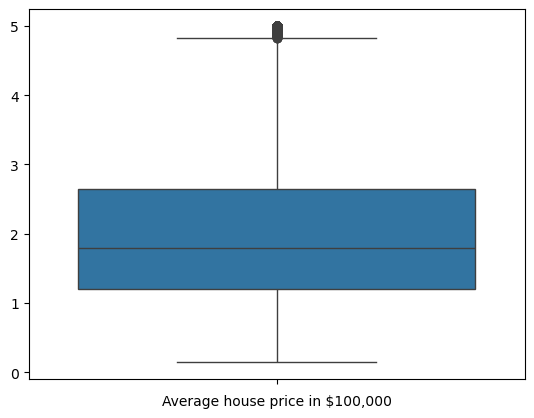

In [7]:
# Box plot for the target variable
fig, ax = plt.subplots()
sns.boxplot(housing.target, ax=ax)
ax.set_xlabel("Average house price in $100,000")
plt.show();

When we look at the boxplots of the other features we see that there are also outliers for the features `MedInc`, `AveRooms`, `AveBedrms`, `Population` and `AveOccup`, but they are hard to see.


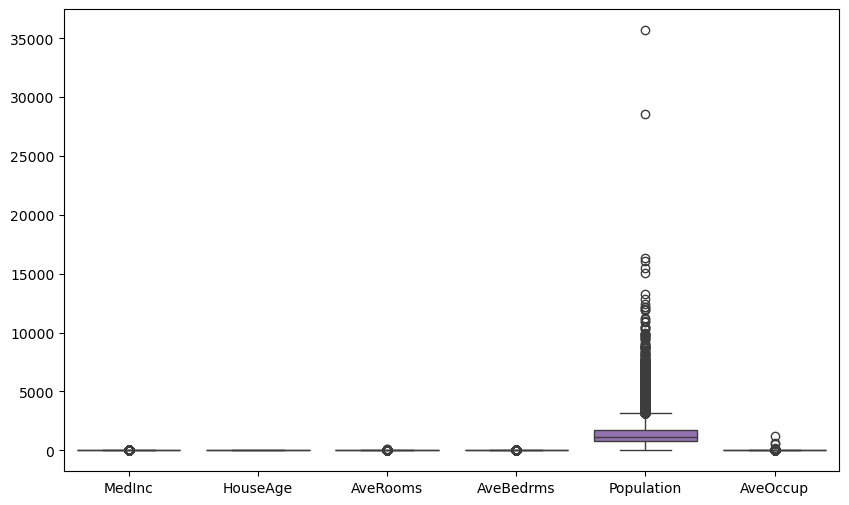

In [8]:
# Box plot for the features `MedInc`, `HouseAge`, `AveRooms`,`AveBedrooms`, `Population`, and `AveOccup`
features = ["MedInc", "HouseAge", "AveRooms", "AveBedrms", "Population", "AveOccup"]

# select the columns corresponding to the features
data = pd.DataFrame(housing.data, columns=housing.feature_names)
data = data[features]

# Plot the box plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=data, ax=ax)
plt.show();

So we perform log transformation on the target variable and the features `MedInc`, `AveRooms`, `AveBedrms`, `Population` and `AveOccup`.


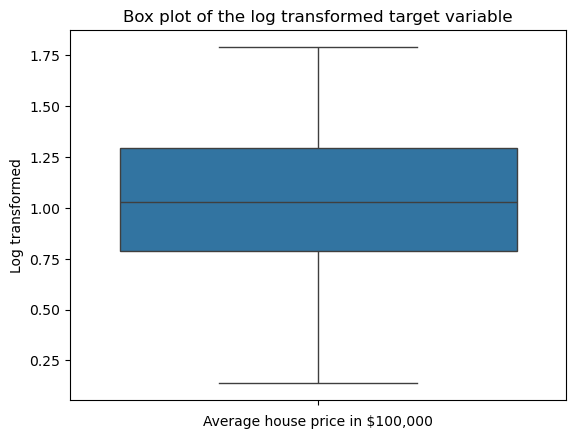

In [9]:
# Box plot for the target variable after applying the log transformation
housing_log1p = np.log1p(housing.target)

fig, ax = plt.subplots()
sns.boxplot(housing_log1p, ax=ax)
ax.set_xlabel("Average house price in $100,000")
ax.set_ylabel("Log transformed")
ax.set_title("Box plot of the log transformed target variable")
plt.show();

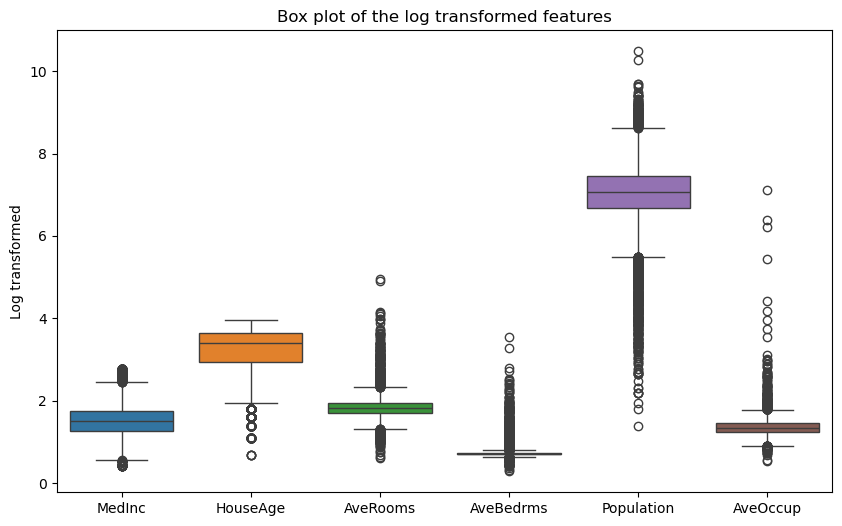

In [10]:
# Box plot for the features `MedInc`, `HouseAge`, `AveRooms`,`AveBedrooms`,`Population` and `AveOccup`
features = ["MedInc", "HouseAge", "AveRooms", "AveBedrms", "Population", "AveOccup"]

# select the columns corresponding to the features
data = pd.DataFrame(housing.data, columns=housing.feature_names)
data = data[features]

# log1p transformation
data = np.log1p(data)

# Plot the box plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(data=data, ax=ax)
ax.set_ylabel("Log transformed")
ax.set_title("Box plot of the log transformed features")
plt.show();

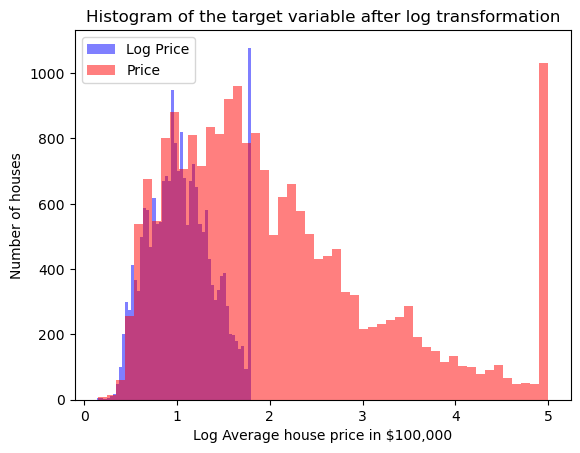

In [11]:
# apply log transformation to the target variable
y_log = np.log1p(housing.target)

# Plot the histogram of the target variable after log transformation
plt.hist(y_log, bins=50, color="blue", alpha=0.5)
plt.hist(housing.target, bins=50, color="red", alpha=0.5)
plt.xlabel("Log Average house price in $100,000")
plt.ylabel("Number of houses")
plt.title("Histogram of the target variable after log transformation")
plt.legend(["Log Price", "Price"])
plt.show();

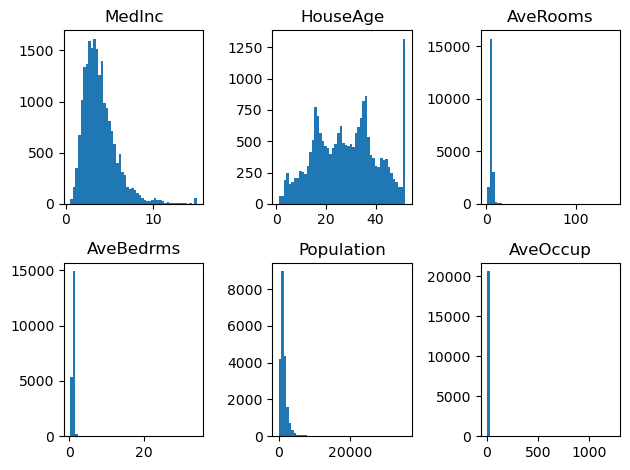

In [12]:
# show the histogram of the features 'MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup'
for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.hist(housing.data[:, i], bins=50)
    plt.title(housing.feature_names[i])
plt.tight_layout()
plt.show();


`HouseAge` seems to have a bimodal distribution and is capped at 52. `MedInc` seems to have a right-skewed distribution. The other features are not distinguishable from graphs.


So let's perform log transformation on the features `MedInc`, `AveRooms`, `AveBedrms`, `Population` and `AveOccup`.


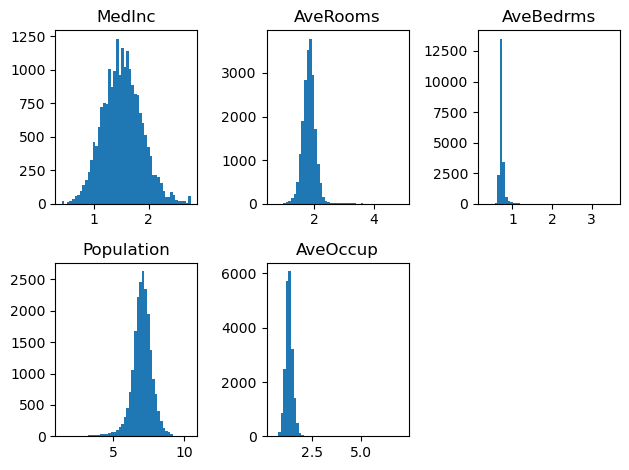

In [13]:
# show the log1p histogram of the features 'MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup'
features = ["MedInc", "AveRooms", "AveBedrms", "Population", "AveOccup"]

# select the columns corresponding to the features
data = pd.DataFrame(housing.data, columns=housing.feature_names)
data = data[features]

# log1p transformation
data = np.log1p(data)

for i in range(5):
    plt.subplot(2, 3, i + 1)
    plt.hist(data.iloc[:, i], bins=50)
    plt.title(features[i])
plt.tight_layout()
plt.show();

Now we can see that the distributions of the features `MedInc`, `AveRooms`, `AveBedrms`, `Population` and `AveOccup` are more symmetric.


## Bivariate Analysis


Combinations of features gives us a better understanding of the data. For example, the scatter plot of `MedInc` and the target variable shows a positive correlation.


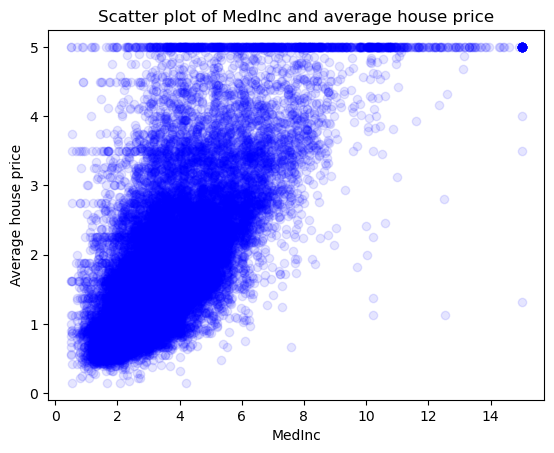

In [14]:
# plot the scatter plot of the feature 'MedInc' and the target variable
plt.scatter(housing.data[:, 0], housing.target, color="blue", alpha=0.1)
plt.xlabel("MedInc")
plt.ylabel("Average house price")
plt.title("Scatter plot of MedInc and average house price")
plt.show();

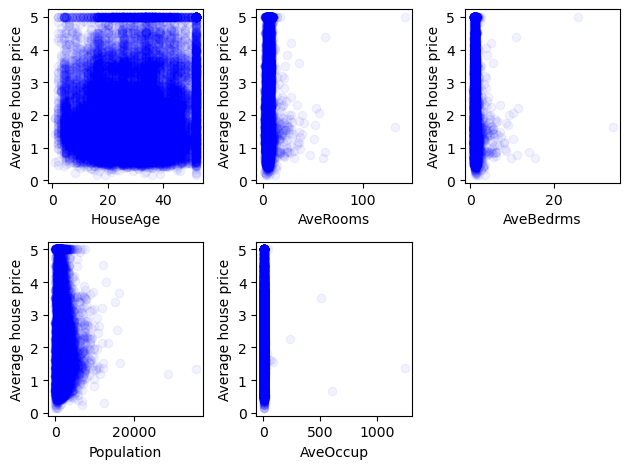

In [15]:
# plot scatter plots of the features 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup' and the target variable
for i in range(1, 6):
    plt.subplot(2, 3, i)
    plt.scatter(housing.data[:, i], housing.target, color="blue", alpha=0.05)
    plt.xlabel(housing.feature_names[i])
    plt.ylabel("Average house price")
plt.tight_layout()
plt.show();

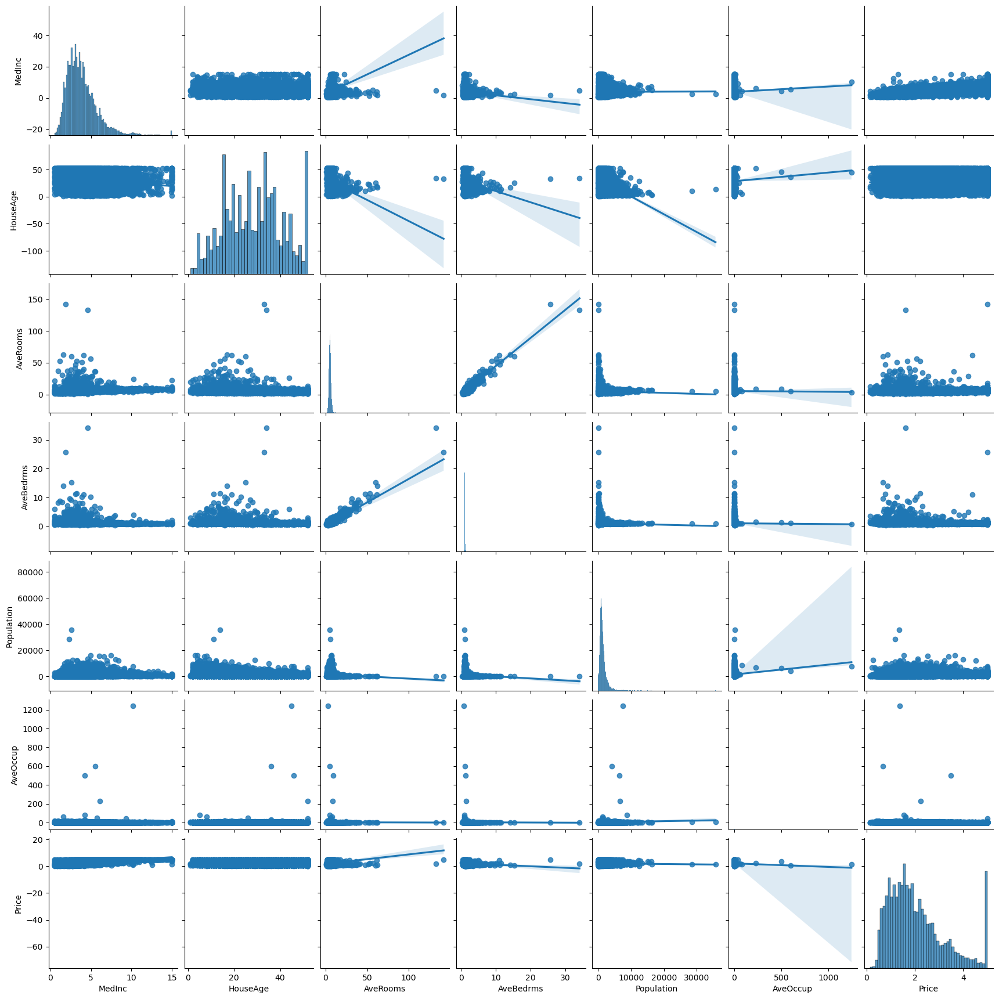

In [77]:
df_housing = pd.DataFrame(housing.data, columns=housing.feature_names)
df_housing["Price"] = housing.target

features = [
    "MedInc",
    "HouseAge",
    "AveRooms",
    "AveBedrms",
    "Population",
    "AveOccup",
    "Price",
]

sns.pairplot(data=df_housing[features], kind="reg")  # try scatter, kde or hist
plt.show();

For the other variables we see that there is no clear relationship with the target variable, except for `AveRooms` and `AveBedrms` which have a positive correlation.

Another correlation seems to be between `Population` as well as `AveRooms` and `AveBedrms`, less population means more rooms and bedrooms.

We have two outliers in the scatter plot for `AveRooms` > 70, `AveBedrms` > 16, `Population` > 16000 . These are the two points with a high number of rooms, bedrooms and population. We will later remove these outliers. I also spotted outliers for `AveOccup` > 100. We will remove these outliers as well.

It becomes clear that the features `MedInc`, `HouseAge` and `Price` are capped. `MedInc` is capped at 15, `HouseAge` is capped at 52 and `Price` is capped at 5.


### Correlation Matrix


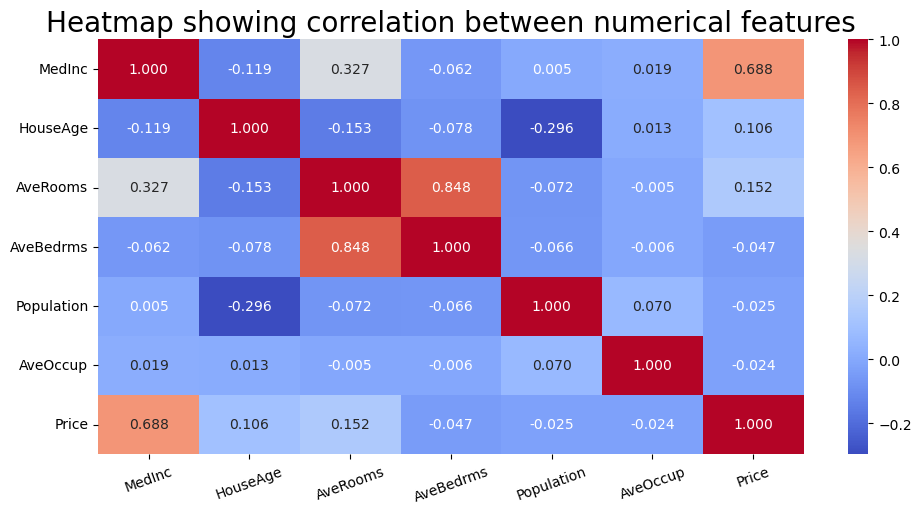

In [78]:
corr = df_housing[features].corr()
# plot as a heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".3f")
plt.xticks(rotation=20)
plt.tight_layout()
plt.title("Heatmap showing correlation between numerical features", fontsize=20)
plt.show();

### Maps


Next we look at the geographical distribution of the data. The scatter plot of the latitude and longitude shows that the data is from California. The scatter plot of the latitude and longitude colored by the target variable shows that the house prices are higher near the coast. Especially in the San Francisco Bay Area and around Los Angeles.


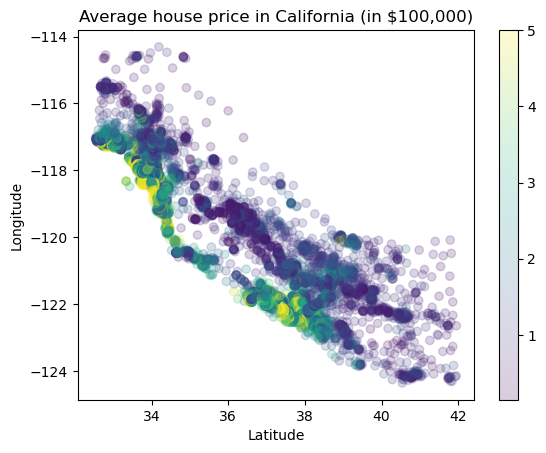

In [17]:
# plot lat and long, color by average house price
plt.scatter(housing.data[:, 6], housing.data[:, 7], c=housing.target, alpha=0.2)
plt.colorbar()
plt.xlabel("Latitude")
plt.ylabel("Longitude")
plt.title("Average house price in California (in $100,000)")
plt.show();

In [18]:
# Assuming you have a 'housing' dataset with 'Latitude', 'Longitude', and 'Price'
df = pd.DataFrame(housing.data, columns=housing.feature_names)
df["Price"] = housing.target


for feature in [
    "MedInc",
    "HouseAge",
    "AveRooms",
    "AveBedrms",
    "Population",
    "AveOccup",
    "Price",
]:
    # Create the scatter_geo plot
    fig = px.scatter_geo(
        df,
        lat="Latitude",
        lon="Longitude",
        color=feature,
        color_continuous_scale="Bluered",
        opacity=0.2,
        #        title="Average House Price in California",
    )

    # Update map appearance
    fig.update_geos(
        center=dict(lat=37, lon=-119),
        projection_scale=25,
        projection_type="mercator",
        resolution=50,
    )

    # Updating layout for larger map and smaller color bar
    fig.update_layout(
        margin=dict(l=20, r=10, t=40, b=10),
        height=500,
        width=550,
    )

    # Override the color bar layout
    fig.update_coloraxes(
        colorbar=dict(
            title=feature,
            titleside="right",
            orientation="v",
        )
    )

    # Show the figure
    fig.show()

`MedInc` seems to be higher near the coast as well. The other features do not show a clear relationship with the geographical location.


Let's have a detailed view on the situation in the Bay Area. The scatter plot of the latitude and longitude colored by the target variable shows a more differentiated picture.


In [19]:
# Assuming you have a 'housing' dataset with 'Latitude', 'Longitude', and 'Price'
df = pd.DataFrame(housing.data, columns=housing.feature_names)
df["Price"] = housing.target

# Create the scatter_map plot
fig = px.scatter_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    color="Price",
    color_continuous_scale="Bluered",
    opacity=0.2,
    title="Average House Price in San Francisco",
    height=500,
    width=550,
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center_lon=-122.4,
    mapbox_center_lat=37.7,
    mapbox_zoom=9,
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
)
fig.update_coloraxes(
    colorbar=dict(
        title="Price in 100,000 $",
        titleside="right",
        orientation="v",
    )
)
fig.show()

## Building a Linear Regression Model


In [20]:
# Load the data
X, y = fetch_california_housing(return_X_y=True)
X, y

(array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
           37.88      , -122.23      ],
        [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
           37.86      , -122.22      ],
        [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
           37.85      , -122.24      ],
        ...,
        [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
           39.43      , -121.22      ],
        [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
           39.43      , -121.32      ],
        [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
           39.37      , -121.24      ]]),
 array([4.526, 3.585, 3.521, ..., 0.923, 0.847, 0.894]))

In [21]:
X.shape, y.shape

((20640, 8), (20640,))

In [22]:
# Check for missing values
np.isnan(X).sum(), np.isnan(y).sum()

(0, 0)

In [23]:
# Split the data train, val, test (60/20/20)
X_full_train, X_test, y_full_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
X_train, X_val, y_train, y_val = train_test_split(
    X_full_train, y_full_train, test_size=0.25, random_state=42
)

In [24]:
# # Scale the data
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_val_scaled = scaler.transform(X_val)
# X_test_scaled = scaler.transform(X_test)

In [25]:
# Train the model
model = LinearRegression(n_jobs=-1)
model.fit(X_train, y_train)

LinearRegression(n_jobs=-1)

In [26]:
# Evaluate the model
model.score(X_val, y_val)

0.6142000785497226

In [27]:
# # Train the scaled model
# model_scaled = LinearRegression(n_jobs=-1)
# model_scaled.fit(X_train_scaled, y_train)

In [28]:
# # Evaluate the model
# model_scaled.score(X_val_scaled, y_val)

In [29]:
model.coef_

array([ 4.55603516e-01,  9.51867573e-03, -1.34972463e-01,  8.62278742e-01,
       -8.39178933e-06, -3.69767511e-03, -4.16827258e-01, -4.29879849e-01])

In [30]:
model.intercept_

-36.7041211614242

In [31]:
# Make predictions
y_pred = model.predict(X_val)

# create a dataframe with the actual and predicted values
df = pd.DataFrame({"Actual": y_val, "Predicted": y_pred})
df

,Actual,Predicted
0,0.96700,1.449107
1,0.75500,1.033908
2,4.30900,2.351465
3,3.32600,2.254493
4,5.00001,3.405861
...,...,...
4123,0.81100,1.199964
4124,3.45000,2.449945
4125,3.44200,3.391948
4126,3.87800,2.598973


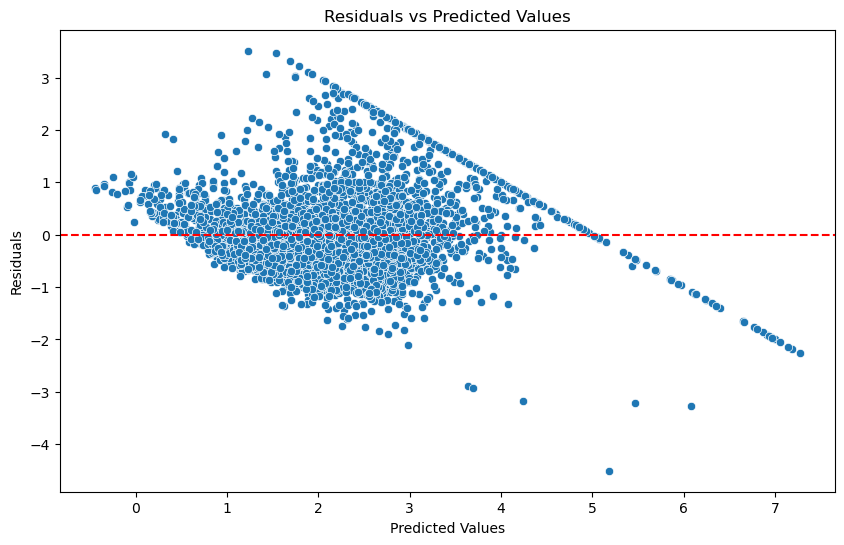

In [32]:
# Calculate residuals
residuals = df["Actual"] - df["Predicted"]

# Add residuals to the dataframe
df["Residuals"] = residuals

# Plot residuals
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df["Predicted"], y=df["Residuals"])
plt.axhline(0, color="red", linestyle="--")  # Add a horizontal line at 0
plt.title("Residuals vs Predicted Values")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()


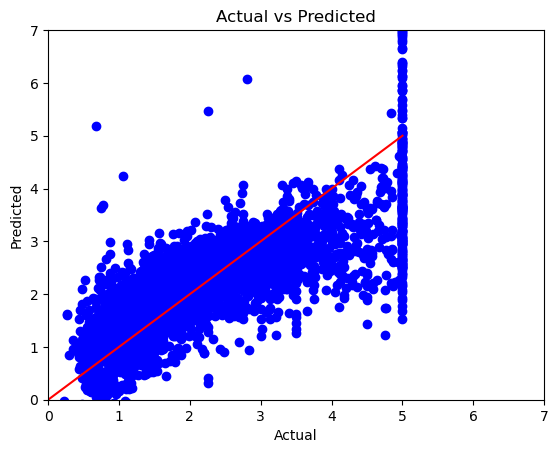

In [33]:
# Plot the predictions
plt.plot(y_val, y_pred, "bo")

x = np.linspace(0, 5, 100)
y = x
plt.plot(x, y, "r")

plt.xlim(0, 7)
plt.ylim(0, 7)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted")
plt.show();

## Feature engineering


Since we could see that the distance to coast and to the big agglomerations in the Bay Area and Los Angeles could be important, we will add these features to the dataset.


In [80]:
df = pd.DataFrame(housing.data, columns=housing.feature_names)
df["Price"] = housing.target
df

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Price
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


In [81]:
# 1. Load the coastline GeoJSON file
coastline_gdf = gpd.read_file("../data/cal_coastline.geojson")

# Re-project the coastline to a projected CRS (EPSG:3857 - Web Mercator)
coastline_gdf = coastline_gdf.to_crs(epsg=3857)

# 2. Example DataFrame with lon and lat

# 3. Convert the DataFrame to a GeoDataFrame with Point geometry
geometry = [Point(xy) for xy in zip(df["Longitude"], df["Latitude"])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

# 4. Define LA and SF as points and re-project them too
sf_coords = gpd.GeoSeries([Point(-122.4194, 37.7749)], crs="EPSG:4326").to_crs(
    epsg=3857
)[0]
la_coords = gpd.GeoSeries([Point(-118.2437, 34.0522)], crs="EPSG:4326").to_crs(
    epsg=3857
)[0]

# 5. Calculate the distance to SF and LA for each point
df["distance_to_SF"] = gdf.geometry.apply(lambda x: x.distance(sf_coords))
df["distance_to_LA"] = gdf.geometry.apply(lambda x: x.distance(la_coords))

# 6. Create a new column for the minimum distance to LA or SF
df["min_distance_to_LA_or_SF"] = df[["distance_to_SF", "distance_to_LA"]].min(axis=1)

# 7. Calculate the distance to the nearest coastline (projected CRS)
df["distance_to_coast"] = gdf.geometry.apply(lambda x: coastline_gdf.distance(x).min())

/opt/homebrew/Caskroom/miniforge/base/envs/ML_Zoomcamp2024/lib/python3.11/site-packages/pyogrio/raw.py:194: RuntimeWarning:

Several features with id = 0 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer



In [82]:
# Display the updated GeoDataFrame with distances
display(
    df[
        [
            "Longitude",
            "Latitude",
            "distance_to_SF",
            "distance_to_LA",
            "min_distance_to_LA_or_SF",
            "distance_to_coast",
        ]
    ]
)

,Longitude,Latitude,distance_to_SF,distance_to_LA,min_distance_to_LA_or_SF,distance_to_coast
0,-122.23,37.88,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
1,-122.22,37.86,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
2,-122.24,37.85,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
3,-122.25,37.85,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
4,-122.25,37.85,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
...,...,...,...,...,...,...
20635,-121.09,39.48,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
20636,-121.21,39.49,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
20637,-121.22,39.43,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
20638,-121.32,39.43,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07


In [83]:
display(df)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Price,distance_to_SF,distance_to_LA,min_distance_to_LA_or_SF,distance_to_coast
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847,1.436631e+07,1.376751e+07,1.376751e+07,1.357230e+07


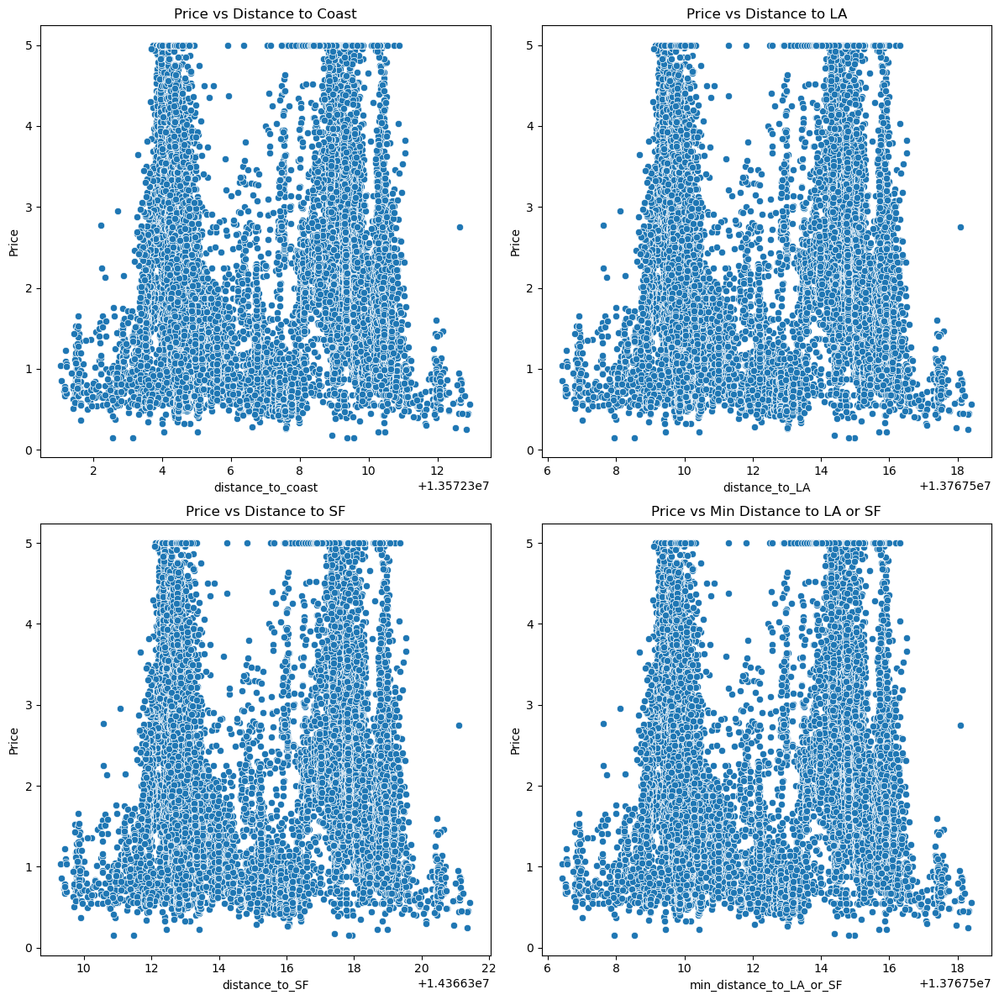

In [84]:
# plot price vs distance to coast/la/sf/nearest

fig, ax = plt.subplots(2, 2, figsize=(12, 12))

# Price vs distance to coast
sns.scatterplot(data=df, x="distance_to_coast", y="Price", ax=ax[0, 0])
ax[0, 0].set_title("Price vs Distance to Coast")

# Price vs distance to LA
sns.scatterplot(data=df, x="distance_to_LA", y="Price", ax=ax[0, 1])
ax[0, 1].set_title("Price vs Distance to LA")

# Price vs distance to SF
sns.scatterplot(data=df, x="distance_to_SF", y="Price", ax=ax[1, 0])
ax[1, 0].set_title("Price vs Distance to SF")

# Price vs min distance to LA or SF
sns.scatterplot(data=df, x="min_distance_to_LA_or_SF", y="Price", ax=ax[1, 1])
ax[1, 1].set_title("Price vs Min Distance to LA or SF")

plt.tight_layout()
plt.show();

/opt/homebrew/Caskroom/miniforge/base/envs/ML_Zoomcamp2024/lib/python3.11/site-packages/pyogrio/raw.py:194: RuntimeWarning:

Several features with id = 0 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer



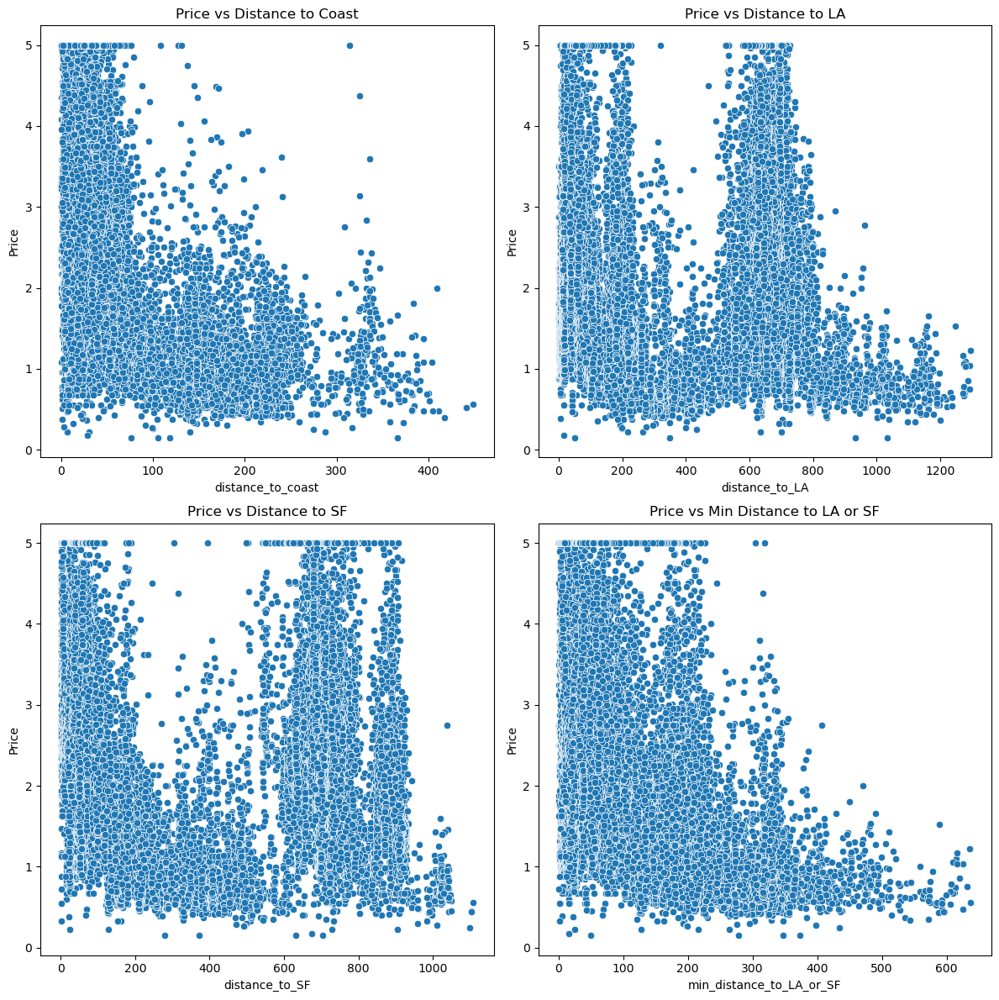

In [85]:
# 1. Load the coastline GeoJSON file
coastline_gdf = gpd.read_file("../data/cal_coastline.geojson")

# Re-project the coastline to a projected CRS (EPSG:3857 - Web Mercator)
coastline_gdf = coastline_gdf.to_crs(epsg=3857)

# 2. Convert the DataFrame to a GeoDataFrame with Point geometry
geometry = [Point(xy) for xy in zip(df["Longitude"], df["Latitude"])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

# 3. Re-project the points to the same projected CRS (EPSG:3857)
gdf = gdf.to_crs(epsg=3857)

# 4. Define LA and SF as points and re-project them too
sf_coords = gpd.GeoSeries([Point(-122.4194, 37.7749)], crs="EPSG:4326").to_crs(
    epsg=3857
)[0]
la_coords = gpd.GeoSeries([Point(-118.2437, 34.0522)], crs="EPSG:4326").to_crs(
    epsg=3857
)[0]

# 5. Calculate the distance to SF and LA for each point (in kilometers)
df["distance_to_SF"] = gdf.geometry.apply(
    lambda x: x.distance(sf_coords) / 1000
)  # Convert to km
df["distance_to_LA"] = gdf.geometry.apply(
    lambda x: x.distance(la_coords) / 1000
)  # Convert to km

# 6. Create a new column for the minimum distance to LA or SF
df["min_distance_to_LA_or_SF"] = df[["distance_to_SF", "distance_to_LA"]].min(axis=1)

# 7. Calculate the distance to the nearest coastline (in kilometers)
df["distance_to_coast"] = gdf.geometry.apply(
    lambda x: coastline_gdf.distance(x).min() / 1000
)  # Convert to km

# Plotting the price vs distance to coast/LA/SF/min
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

# Price vs distance to coast
sns.scatterplot(data=df, x="distance_to_coast", y="Price", ax=ax[0, 0])
ax[0, 0].set_title("Price vs Distance to Coast")

# Price vs distance to LA
sns.scatterplot(data=df, x="distance_to_LA", y="Price", ax=ax[0, 1])
ax[0, 1].set_title("Price vs Distance to LA")

# Price vs distance to SF
sns.scatterplot(data=df, x="distance_to_SF", y="Price", ax=ax[1, 0])
ax[1, 0].set_title("Price vs Distance to SF")

# Price vs min distance to LA or SF
sns.scatterplot(data=df, x="min_distance_to_LA_or_SF", y="Price", ax=ax[1, 1])
ax[1, 1].set_title("Price vs Min Distance to LA or SF")

plt.tight_layout()
plt.show()

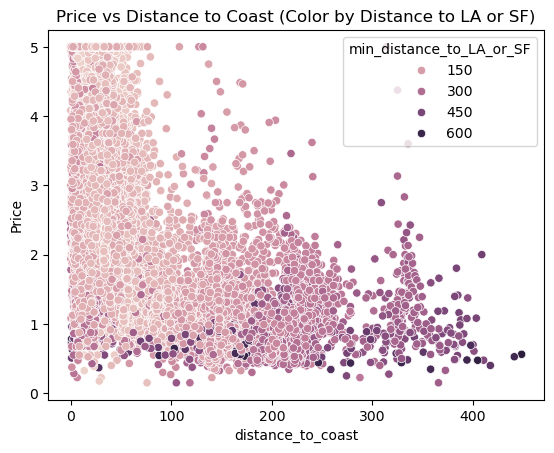

In [86]:
# plot the price vs distance to coast, color by distance to LA or SF


sns.scatterplot(
    data=df, x="distance_to_coast", y="Price", hue="min_distance_to_LA_or_SF"
)
plt.title("Price vs Distance to Coast (Color by Distance to LA or SF)")
plt.show();

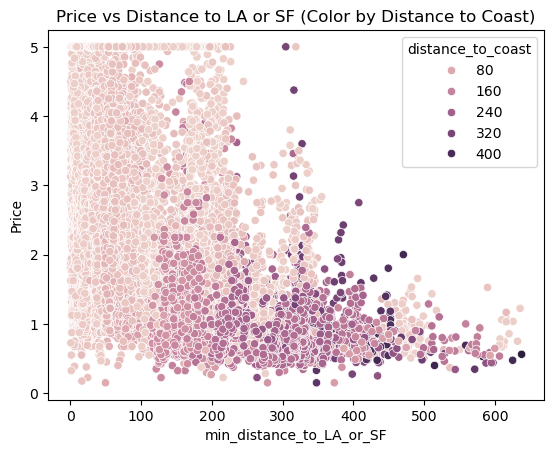

In [87]:
# plot the price vs distance to LA or SF, color by distance to coast

sns.scatterplot(
    data=df, x="min_distance_to_LA_or_SF", y="Price", hue="distance_to_coast"
)
plt.title("Price vs Distance to LA or SF (Color by Distance to Coast)")
plt.show();


In [88]:
# Create the scatter_map plot
fig = px.scatter_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    color="distance_to_coast",
    color_continuous_scale="Bluered",
    opacity=0.2,
    title="Distance to Coast",
    height=500,
    width=550,
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center_lon=-119,
    mapbox_center_lat=37,
    mapbox_zoom=4.5,
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
)
fig.update_coloraxes(
    colorbar=dict(
        title="distance_to_coast in km",
        titleside="right",
        orientation="v",
    )
)
fig.show()


In [89]:
# Create the scatter_map plot
fig = px.scatter_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    color="min_distance_to_LA_or_SF",
    color_continuous_scale="Bluered",
    opacity=0.2,
    title="Distance to LA or SF",
    height=500,
    width=550,
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center_lon=-119,
    mapbox_center_lat=37,
    mapbox_zoom=4.5,
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
)
fig.update_coloraxes(
    colorbar=dict(
        title="min Distance to LA or SF in km",
        titleside="right",
        orientation="v",
    )
)
fig.show()


In [90]:
df.columns

Index(['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup',
       'Latitude', 'Longitude', 'Price', 'distance_to_SF', 'distance_to_LA',
       'min_distance_to_LA_or_SF', 'distance_to_coast'],
      dtype='object')

In [94]:
features = [
    "MedInc",
    "HouseAge",
    "AveRooms",
    "AveBedrms",
    "Population",
    "AveOccup",
    "Price",
    "distance_to_coast",
    "min_distance_to_LA_or_SF",
]

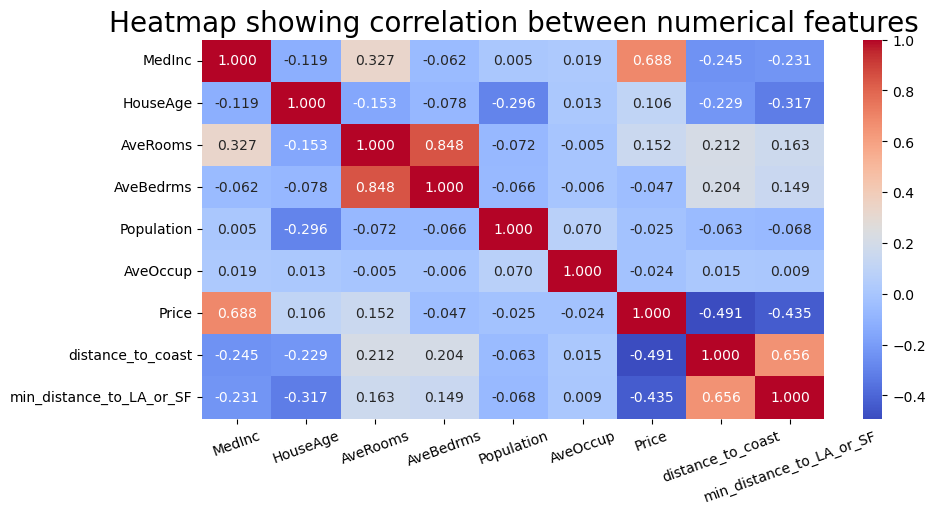

In [95]:
corr = df[features].corr()
# plot as a heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".3f")
plt.xticks(rotation=20)
plt.tight_layout()
plt.title("Heatmap showing correlation between numerical features", fontsize=20)
plt.show();


In [114]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


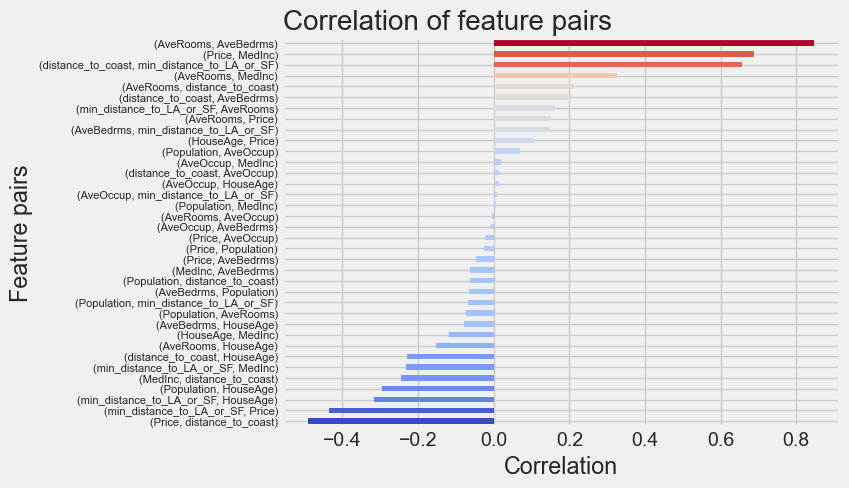

In [121]:
plt.style.use("fivethirtyeight")

corr2 = df[features].corr().unstack().sort_values(ascending=True).drop_duplicates()
# drop year year correlation
corr2 = corr2.drop(corr2.index[-1])

# Normalize the correlation values to range [0, 1]
norm = plt.Normalize(vmin=corr2.min(), vmax=corr2.max())
# Choose a colormap, e.g., coolwarm
cmap = plt.get_cmap("coolwarm")
# Generate colors based on the normalized correlation values
colors = cmap(norm(corr2.values))
# Plot the bar chart with the colormap
corr2.plot(kind="barh", color=colors, layout="constrained")
plt.title("Correlation of feature pairs", loc="left", fontsize=20)
plt.xlabel("Correlation")
plt.ylabel("Feature pairs")
# adjust bar thickness and spacing
plt.yticks(fontsize=8)

plt.show();


## Training linear regression model with extra features


In [46]:
X = df[features]
y = df["Price"]

#### Split the data train, val, test (60/20/20)


In [ ]:
X_full_train, X_test, y_full_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
X_train, X_val, y_train, y_val = train_test_split(
    X_full_train, y_full_train, test_size=0.25, random_state=42
)

#### Train the model


In [ ]:
model = LinearRegression(n_jobs=-1)
model.fit(X_train, y_train)

#### Evaluate the model


In [ ]:
model.score(X_val, y_val)

No improvement in the model performance was observed.


#### Make predictions


In [ ]:
y_pred = model.predict(X_val)

# create a dataframe with the actual and predicted values
df_eval = pd.DataFrame({"Actual": y_val, "Predicted": y_pred})
df_eval

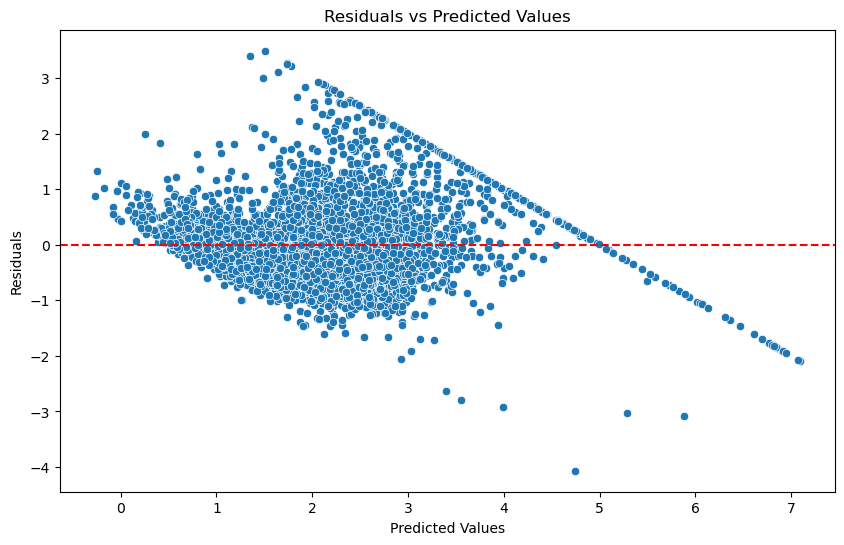

In [51]:
# Calculate residuals
residuals = df_eval["Actual"] - df_eval["Predicted"]

# Add residuals to the dataframe
df_eval["Residuals"] = residuals

# Plot residuals
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_eval["Predicted"], y=df_eval["Residuals"])
plt.axhline(0, color="red", linestyle="--")  # Add a horizontal line at 0
plt.title("Residuals vs Predicted Values")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()


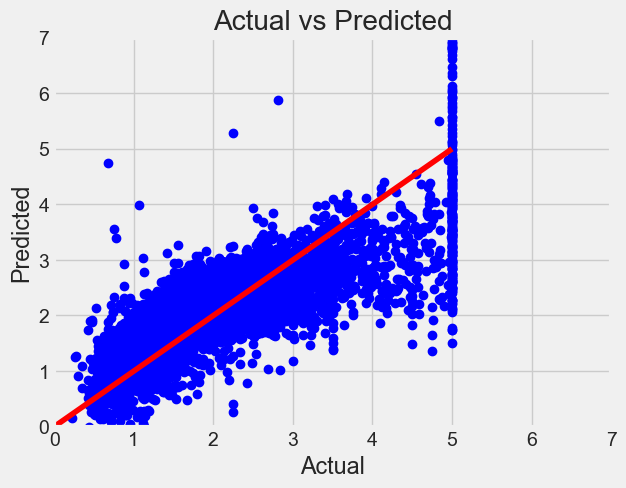

In [122]:
# Plot the predictions
plt.plot(y_val, y_pred, "bo")

x = np.linspace(0, 5, 100)
y = x
plt.plot(x, y, "r")

plt.xlim(0, 7)
plt.ylim(0, 7)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted")
plt.show();

## Outliers & Cut-offs ?


## Scaling


## Mutual Information


## Regularized Linear Regression


### Lasso Regression


In [75]:
alphas = [0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]

for a in alphas:
    lasso_model = Lasso(
        alpha=a, max_iter=1000, random_state=42, tol=0.0001, warm_start=False
    )
    lasso_model.fit(X_train, y_train)
    score = lasso_model.score(X_val, y_val)
    print(f"Alpha: {a:>6}, Lasso Score: {score:.4}")

Alpha: 0.0001, Lasso Score: 0.6174
Alpha:  0.001, Lasso Score: 0.6179
Alpha:   0.01, Lasso Score: 0.6173
Alpha:    0.1, Lasso Score: 0.6073
Alpha:    0.5, Lasso Score: 0.5438
Alpha:    1.0, Lasso Score: 0.3681
Alpha:    5.0, Lasso Score: 0.2566
Alpha:   10.0, Lasso Score: 0.2463
Alpha:   50.0, Lasso Score: 0.02027
Alpha:  100.0, Lasso Score: -0.0001745


### Ridge Regression


Ridge regression is a linear regression model that uses L2 regularization. It is particularly useful when the features are correlated. The regularization term is the sum of the squared weights multiplied by the regularization parameter alpha. The higher the alpha, the more the weights are penalized. The regularization term is added to the loss function. The loss function is the mean squared error. The goal is to minimize the loss function.


In [72]:
alphas = [0.00001, 0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]


for a in alphas:
    ridge_model = Ridge(alpha=a, solver="lsqr", max_iter=1000, random_state=42)
    ridge_model.fit(X_train, y_train)
    score = ridge_model.score(X_val, y_val)
    print(f"Alpha: {a:>6}, Score: {score:.5}")

Alpha:  1e-05, Score: 0.61328
Alpha: 0.0001, Score: 0.61328
Alpha:  0.001, Score: 0.61328
Alpha:   0.01, Score: 0.61328
Alpha:    0.1, Score: 0.61328
Alpha:    0.5, Score: 0.61328
Alpha:    1.0, Score: 0.61328
Alpha:    5.0, Score: 0.61328
Alpha:   10.0, Score: 0.61328
Alpha:   50.0, Score: 0.61328
Alpha:  100.0, Score: 0.61328


Lower alpha values give better results. The best alpha value is 0.00001, so far.


### Elastic Net


In [73]:
alphas = [0.00001, 0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 50.0, 100.0]

for a in alphas:
    elastic_model = ElasticNet(alpha=a, l1_ratio=0.5, max_iter=1000, random_state=42)
    elastic_model.fit(X_train, y_train)
    score = elastic_model.score(X_val, y_val)
    print(f"Alpha: {a:>6}, Score: {score:.5}")

Alpha:  1e-05, Score: 0.61738
Alpha: 0.0001, Score: 0.61742
Alpha:  0.001, Score: 0.61783
Alpha:   0.01, Score: 0.61876
Alpha:    0.1, Score: 0.61158
Alpha:    0.5, Score: 0.58037
Alpha:    1.0, Score: 0.51993
Alpha:    5.0, Score: 0.25916
Alpha:   10.0, Score: 0.25661
Alpha:   50.0, Score: 0.17286
Alpha:  100.0, Score: 0.020177


In [74]:
l1_ratios = [
    0.00001,
    0.0001,
    0.001,
    0.01,
    0.1,
    0.5,
    0.75,
    0.9,
    1.0,
]

for l1 in l1_ratios:
    elastic_model = ElasticNet(alpha=5.0, l1_ratio=l1, max_iter=1000, random_state=42)
    elastic_model.fit(X_train, y_train)
    score = elastic_model.score(X_val, y_val)
    print(f"l1_ratio: {l1:>6}, Score: {score:.5}")

l1_ratio:  1e-05, Score: 0.49391
l1_ratio: 0.0001, Score: 0.49386
l1_ratio:  0.001, Score: 0.49337
l1_ratio:   0.01, Score: 0.4884
l1_ratio:    0.1, Score: 0.4119
l1_ratio:    0.5, Score: 0.25916
l1_ratio:   0.75, Score: 0.25812
l1_ratio:    0.9, Score: 0.25728
l1_ratio:    1.0, Score: 0.25664


## Cross-Validation
